In [1]:
!pip install xgboost
!pip install --upgrade category_encoders
!pip install imbalanced-learn
!pip install catboost --user
!pip install autoviz --user

  Using cached xgboost-1.6.2-py3-none-manylinux2014_x86_64.whl (255.9 MB)
  Using cached category_encoders-2.5.1.post0-py2.py3-none-any.whl (72 kB)
  Using cached imbalanced_learn-0.9.1-py3-none-any.whl (199 kB)
  Using cached imbalanced_learn-0.9.0-py3-none-any.whl (199 kB)


In [2]:
import numpy as np 
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.colors
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import StratifiedKFold 
from sklearn.metrics import roc_auc_score, roc_curve, auc
import warnings, gc
warnings.filterwarnings("ignore")

from sklearn import preprocessing
from sklearn.metrics import roc_auc_score
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math
from sklearn.ensemble import GradientBoostingClassifier
import time 
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler,LabelEncoder,OrdinalEncoder,RobustScaler,MinMaxScaler
from sklearn.metrics import plot_confusion_matrix, classification_report,accuracy_score,f1_score,roc_auc_score, confusion_matrix, classification_report,precision_score,recall_score,plot_roc_curve,log_loss
from pandas.plotting import scatter_matrix
import plotly.express as px
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB,MultinomialNB
import category_encoders as ce
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.model_selection import cross_val_score
from numpy import asarray
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import StratifiedKFold,RepeatedStratifiedKFold

from catboost import CatBoostClassifier
from xgboost import XGBClassifier
from numpy import mean,std
from sklearn.metrics import mean_squared_error
from IPython.display import HTML, display, Markdown, clear_output
import warnings
from sklearn.ensemble import StackingClassifier

warnings.filterwarnings("ignore")
%matplotlib inline


In [3]:
train=pd.read_csv('train_amex.csv')
train.drop('Unnamed: 0',axis=1,inplace=True)
train['Spend 2']=pd.to_datetime(train['Spend 2'])

test=pd.read_csv('amex_test.csv')
test.drop('Unnamed: 0',axis=1,inplace=True)
test=test.sample(train.shape[0],random_state=1)
test['S_2']=pd.to_datetime(test['S_2'])

In [4]:
titles=['Delinquency '+str(i).split('_')[1] if i.startswith('D') else 'Spend '+str(i).split('_')[1] 
        if i.startswith('S') else 'Payment '+str(i).split('_')[1]  if i.startswith('P') 
        else 'Balance '+str(i).split('_')[1] if i.startswith('B') else 
        'Risk '+str(i).split('_')[1] for i in test.columns]
titles.pop(0)
titles.insert(0, 'customer_ID')
test.columns=titles

In [5]:
print("The training data begins on {} and ends on {}.".format(train['Spend 2'].min().strftime('%m-%d-%Y'),train['Spend 2'].max().strftime('%m-%d-%Y')))
print("There are {:,.0f} customers in the training set and {} features.".format(train.shape[0],train.shape[1]))

print("--"*40)

print("The test data begins on {} and ends on {}.".format(test['Spend 2'].min().strftime('%m-%d-%Y'),test['Spend 2'].max().strftime('%m-%d-%Y')))
print("There are {:,.0f} customers in the training set and {} features.".format(test.shape[0],test.shape[1]))



The training data begins on 03-01-2018 and ends on 03-31-2018.
There are 39,755 customers in the training set and 191 features.
--------------------------------------------------------------------------------
The test data begins on 04-01-2018 and ends on 10-31-2019.
There are 39,755 customers in the training set and 190 features.


In [6]:
def quantity_missing_values(data):
    """function to obtain the number and percentage of missing values for each variable of a dataframe, 
    in descending order"""
    
    values = data.isnull().sum()
    percentage = 100 * values / len(data)
    table = pd.concat([values, percentage.round(2)], axis=1)
    table.columns = ['Number of missing values', '% of missing values']
    
    return table[table['Number of missing values'] != 0].sort_values('% of missing values', ascending = False).style.background_gradient('Oranges')

In [7]:
display(quantity_missing_values(train))
print('--'*40)
display(quantity_missing_values(test))


,Number of missing values,% of missing values


--------------------------------------------------------------------------------


,Number of missing values,% of missing values


In [8]:
# train_float = train.select_dtypes(include=['float']).copy()
# test_float = test.select_dtypes(include=['float']).copy()

In [9]:
# df=train_float.copy().reset_index()
# from sklearn.impute import KNNImputer
# imputer = KNNImputer()
# # fit on the dataset
# for i in df.columns[2:]:
#     if df[i].isnull().any():
#         print(i)
#         imputer.fit(df[i].values.reshape(-1, 1))
#         Xtrans = imputer.transform(df[i].values.reshape(-1, 1))
#         print("doing work")
#         train[i]=Xtrans

In [10]:
# df=test_float.copy().reset_index()
# from sklearn.impute import KNNImputer
# imputer = KNNImputer()
# # fit on the dataset
# for i in df.columns[2:]:
#     if df[i].isnull().any():
#         print(i)
#         imputer.fit(df[i].values.reshape(-1, 1))
#         Xtrans = imputer.transform(df[i].values.reshape(-1, 1))
#         print("doing work")
#         test[i]=Xtrans

## EDA ##

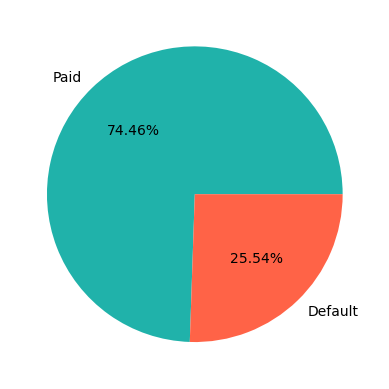

In [11]:
target=train.Target.value_counts(normalize=True)
target.rename(index={1:'Default',0:'Paid'},inplace=True)


plt.pie(target*100,labels=target.index,colors=['lightseagreen','tomato'], autopct='%1.2f%%')
plt.show()

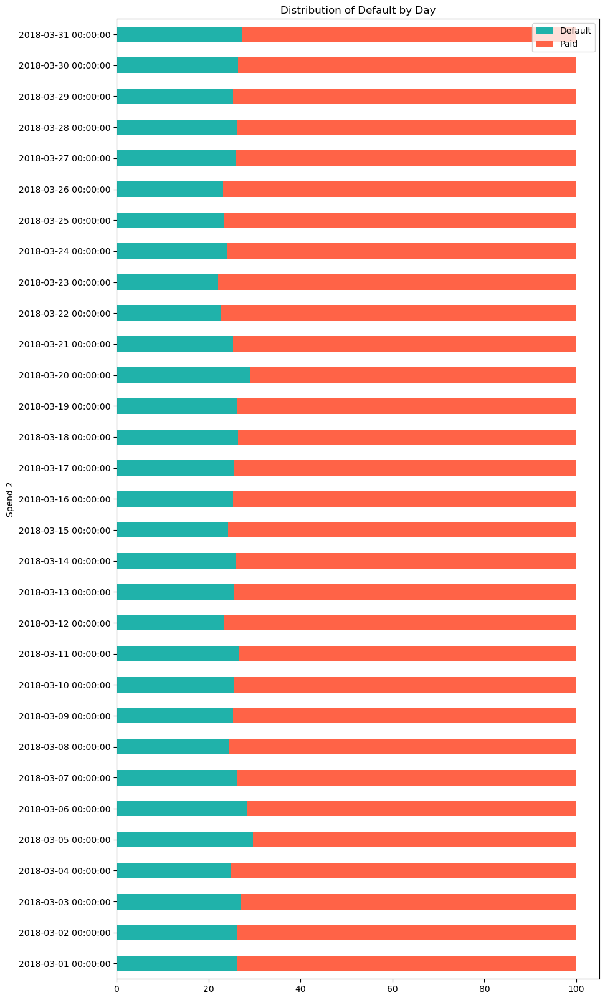

In [12]:
# plot bars in stack manner
target=pd.DataFrame(data={'Default':train.groupby('Spend 2')['Target'].mean()*100})
target['Paid']=np.abs(train.groupby('Spend 2')['Target'].mean()-1)*100


target.plot(kind='barh',stacked=True,figsize=(10,20), mark_right = True,title='Distribution of Default by Day',color =['lightseagreen', 'tomato'])
plt.show()

About 25% of customers in the training data have defaulted. This proportion is consistent across each day in the training set, with a weekly seasonal trend in the day of the month when customers receive their statements.

In [13]:
test['Day']=test['Spend 2'].dt.day_name()
test['Month']=test['Spend 2'].dt.month_name()
test['Year']=test['Spend 2'].dt.year
test.drop('Spend 2',axis=1,inplace=True)

Imported v0.1.58. After importing, execute '%matplotlib inline' to display charts in Jupyter.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Update: verbose=0 displays charts in your local Jupyter notebook.
        verbose=1 additionally provides EDA data cleaning suggestions. It also displays charts.
        verbose=2 does not display charts but saves them in AutoViz_Plots folder in local machine.
        chart_format='bokeh' displays charts in your local Jupyter notebook.
        chart_format='server' displays charts in your browser: one tab for each chart type
        chart_format='html' silently saves interactive HTML files in your local machine
Shape of your Data Set loaded: (39755, 192)
#######################################################################################
######################## C L A S 

,Nuniques,dtype,Nulls,Nullpercent,NuniquePercent,Value counts Min,Data cleaning improvement suggestions
Unnamed: 0,39755,int64,0,0.000000,100.000000,0,possible ID column: drop
customer_ID,39755,object,0,0.000000,100.000000,1,"combine rare categories, possible ID column: drop"
Balance 25,10938,float64,0,0.000000,27.513520,0,skewed: cap or drop outliers
Balance 11,10831,float64,0,0.000000,27.244372,0,skewed: cap or drop outliers
Balance 3,10751,float64,0,0.000000,27.043139,0,skewed: cap or drop outliers
Spend 5,10739,float64,0,0.000000,27.012954,0,highly skewed: drop outliers or do box-cox transform
Balance 37,10492,float64,0,0.000000,26.391649,0,skewed: cap or drop outliers
Balance 9,10457,float64,0,0.000000,26.303610,0,skewed: cap or drop outliers
Balance 1,10353,float64,0,0.000000,26.042007,0,skewed: cap or drop outliers
Spend 26,10351,float64,0,0.000000,26.036976,0,highly skewed: drop outliers or do box-cox transform


    191 Predictors classified...
        3 variables removed since they were ID or low-information variables
        List of variables removed: ['Unnamed: 0', 'Delinquency 66', 'Delinquency 87']

################ Binary_Classification problem #####################
Number of variables = 188 exceeds limit, finding top 30 variables through XGBoost
    No categorical feature reduction done. All 6 Categorical vars selected 
    Removing correlated variables from 182 numerics using SULO method

After removing highly correlated variables, following 138 numeric vars selected: ['Delinquency 39', 'Delinquency 42', 'Delinquency 43', 'Balance 5', 'Delinquency 46', 'Delinquency 47', 'Delinquency 49', 'Balance 6', 'Delinquency 50', 'Delinquency 51', 'Balance 9', 'Risk 3', 'Delinquency 52', 'Payment 3', 'Balance 10', 'Spend 5', 'Spend 6', 'Delinquency 56', 'Spend 9', 'Delinquency 59', 'Delinquency 60', 'Spend 11', 'Delinquency 65', 'Balance 17', 'Spend 12', 'Risk 6', 'Delinquency 69', 'Delinquency 70

,Nuniques,dtype,Nulls,Nullpercent,NuniquePercent,Value counts Min,Data cleaning improvement suggestions
Spend 5,10739,float64,0,0.000000,27.012954,0,highly skewed: drop outliers or do box-cox transform
Balance 9,10457,float64,0,0.000000,26.303610,0,skewed: cap or drop outliers
Balance 5,9957,float64,0,0.000000,25.045906,0,highly skewed: drop outliers or do box-cox transform
Delinquency 60,9444,float64,0,0.000000,23.755502,0,
Delinquency 71,8549,float64,0,0.000000,21.504213,0,highly skewed: drop outliers or do box-cox transform
Balance 6,8410,float64,0,0.000000,21.154572,0,highly skewed: drop outliers or do box-cox transform
Risk 6,7636,float64,0,0.000000,19.207647,0,highly skewed: drop outliers or do box-cox transform
Spend 9,7406,float64,0,0.000000,18.629103,0,highly skewed: drop outliers or do box-cox transform
Delinquency 65,7385,float64,0,0.000000,18.576280,0,highly skewed: drop outliers or do box-cox transform
Balance 10,7326,float64,0,0.000000,18.427871,0,highly skewed: drop outliers or do box-cox transform


    30 Predictors classified...
    No variables removed since no ID or low-information variables found in data
    List of variables removed: []
   Total columns > 30, too numerous to print.


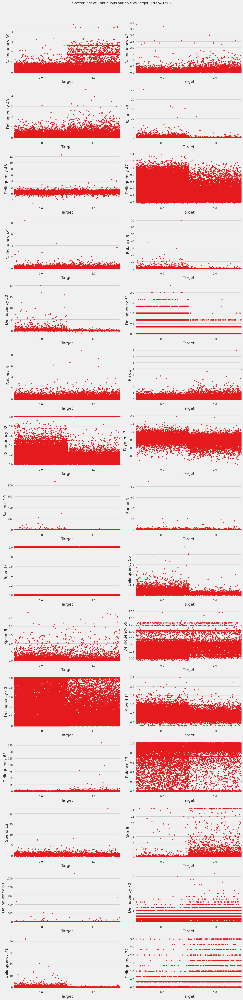

Total Number of Scatter Plots = 465


ValueError: Image size of 1500x87200 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 1500x87200 with 435 Axes>

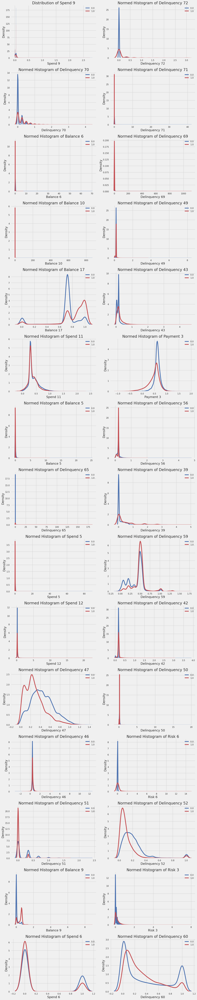

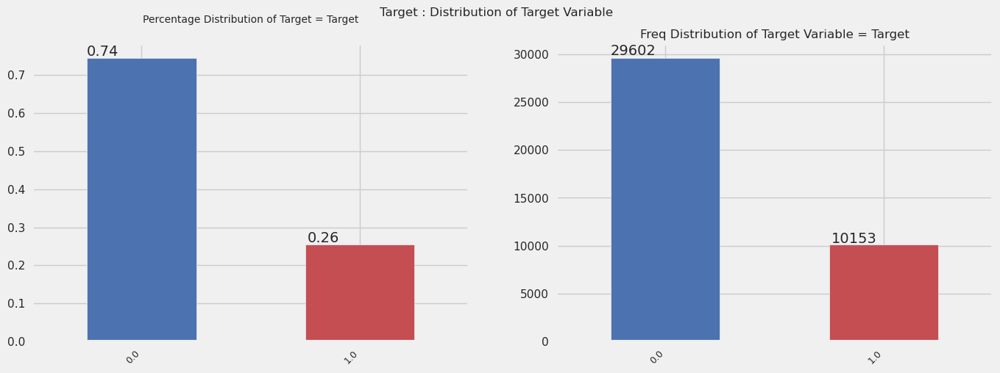

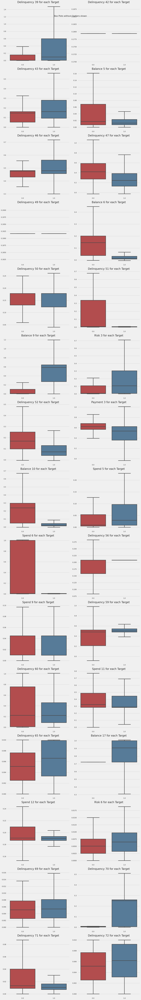

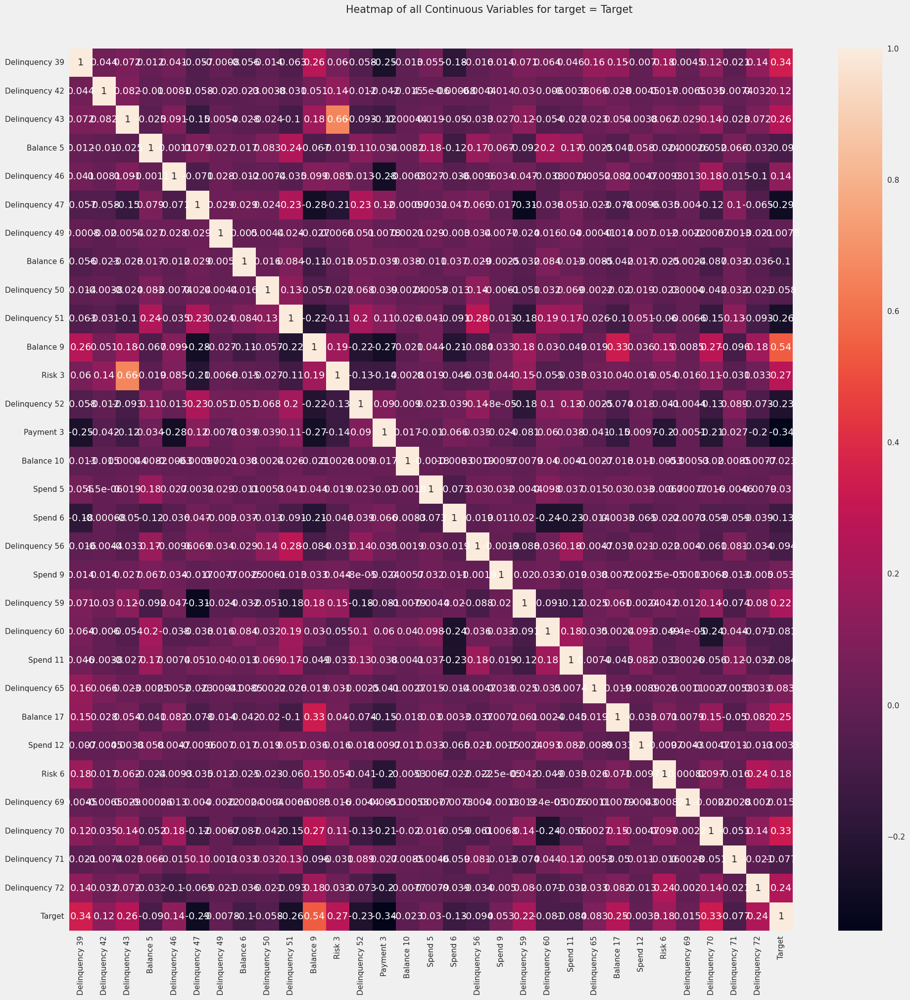

No categorical or boolean vars in data set. Hence no pivot plots...
No categorical or numeric vars in data set. Hence no bar charts.
All Plots done
Time to run AutoViz = 97 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [14]:
from autoviz.AutoViz_Class import AutoViz_Class
import warnings
warnings.filterwarnings("ignore")
AV = AutoViz_Class()
%matplotlib inline
#you have to specify the target variable
dft = AV.AutoViz('train_amex.csv', depVar = 'Target',lowess=False,chart_format="png")

In [15]:
train['Day']=train['Spend 2'].dt.day_name()
train['Month']=train['Spend 2'].dt.month_name()
train['Year']=train['Spend 2'].dt.year
train.drop('Spend 2',axis=1,inplace=True)

## Dealing with categorical data

In [16]:
cat_df = train.select_dtypes(include=['object']).copy()
cat_df_lc=cat_df.copy()
for i in cat_df.columns:
    cat_df_lc[i]=cat_df_lc[i].astype('category')
    cat_df_lc[i]=cat_df_lc[i].cat.codes

for i in cat_df_lc.columns:
    train[i]= cat_df_lc[i]

In [17]:
cat_df = test.select_dtypes(include=['object']).copy()
cat_df_lc=cat_df.copy()
for i in cat_df.columns:
    cat_df_lc[i]=cat_df_lc[i].astype('category')
    cat_df_lc[i]=cat_df_lc[i].cat.codes

for i in cat_df_lc.columns:
    test[i]= cat_df_lc[i]

In [18]:
cols_to_drop = ['Target']
X = train.drop(cols_to_drop, axis=1)
y = pd.DataFrame(train['Target'])

In [19]:
def amex_metric(y_true: pd.DataFrame, y_pred: pd.DataFrame) -> float:

    def top_four_percent_captured(y_true: pd.DataFrame, y_pred: pd.DataFrame) -> float:
        df = (pd.concat([y_true, y_pred], axis='columns')
              .sort_values('prediction', ascending=False))
        df['weight'] = df['Target'].apply(lambda x: 20 if x==0 else 1)
        four_pct_cutoff = int(0.04 * df['weight'].sum())
        df['weight_cumsum'] = df['weight'].cumsum()
        df_cutoff = df.loc[df['weight_cumsum'] <= four_pct_cutoff]
        return (df_cutoff['Target'] == 1).sum() / (df['Target'] == 1).sum()
        
    def weighted_gini(y_true: pd.DataFrame, y_pred: pd.DataFrame) -> float:
        df = (pd.concat([y_true, y_pred], axis='columns')
              .sort_values('prediction', ascending=False))
        df['weight'] = df['Target'].apply(lambda x: 20 if x==0 else 1)
        df['random'] = (df['weight'] / df['weight'].sum()).cumsum()
        total_pos = (df['Target'] * df['weight']).sum()
        df['cum_pos_found'] = (df['Target'] * df['weight']).cumsum()
        df['lorentz'] = df['cum_pos_found'] / total_pos
        df['gini'] = (df['lorentz'] - df['random']) * df['weight']
        return df['gini'].sum()

    def normalized_weighted_gini(y_true: pd.DataFrame, y_pred: pd.DataFrame) -> float:
        y_true_pred = y_true.rename(columns={'Target': 'prediction'})
        return weighted_gini(y_true, y_pred) / weighted_gini(y_true, y_true_pred)

    g = normalized_weighted_gini(y_true, y_pred)
    d = top_four_percent_captured(y_true, y_pred)

    return 0.5 * (g + d)


In [20]:
# get a stacking ensemble of models
def get_stacking():
    level0 = list()
    level0.append(('RF',RandomForestClassifier(bootstrap=True,max_depth=7,max_features=180)))
    level0.append(('cb', CatBoostClassifier(learning_rate=0.01,n_estimators=350,max_depth=3,early_stopping_rounds=10)))
    level1 = CatBoostClassifier(learning_rate= 0.02, max_depth= 5, n_estimators= 300,early_stopping_rounds=10)
    model = StackingClassifier(estimators=level0, final_estimator=level1, cv=StratifiedKFold(n_splits=10, shuffle=True))
    return model
def get_models():
    models = dict()
    models['lr'] = LogisticRegression(max_iter=1000)
    models['knn'] = KNeighborsClassifier()
    models['dt'] = DecisionTreeClassifier(max_depth=5)
    models['rf'] = RandomForestClassifier(bootstrap=True,max_depth=7)
    models['cb'] = CatBoostClassifier(learning_rate= 0.02, max_depth= 5, n_estimators=300,early_stopping_rounds=10)
    models['xgb'] = XGBClassifier(subsample= 0.80,n_estimators= 300, max_depth= 5, learning_rate= 0.02)
    # models['stacking'] = get_stacking()
    return models


                                  

In [21]:
def evaluate_model(model, X, y):
    cv = RepeatedStratifiedKFold(n_splits=10,n_repeats=3, random_state=42)
    scores = cross_val_score(model, X, y, scoring='accuracy', cv=cv)
    return scores

In [22]:
def metrics_classification(Y_test,Y_pred):
    scores=list()
    scores.append(precision_score(Y_pred,Y_test))
    scores.append(recall_score(Y_pred,Y_test))
    scores.append(f1_score(Y_pred,Y_test))
    scores.append(roc_auc_score(Y_pred,Y_test))
    y_pred=pd.DataFrame(data={'prediction':Y_pred})
    y_true=Y_test.copy()
    gini_score=amex_metric(y_true = y_true, y_pred = y_pred)
    scores.append(gini_score)
    scores_df=pd.DataFrame(scores,index=('Precision','Recall','F-1 Score','ROC_AUC','Gini_Score'))
    display(scores_df)
    cf_matrix = confusion_matrix(Y_pred,Y_test)
    group_names = ['True Neg','False Pos','False Neg','True Pos']
    group_counts = ["{0:0.0f}".format(value) for value in cf_matrix.flatten()]
    group_percentages = ["{0:.2%}".format(value) for value in cf_matrix.flatten()/np.sum(cf_matrix)]
    labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in zip(group_names,group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)
    print("Confusion Matrix")
    sns.heatmap(cf_matrix, annot=labels, fmt="", cmap='Blues')
    plt.plot()
    plt.show()

The results for model  LogisticRegression(max_iter=1000) are


,0
Precision,0.198562
Recall,0.255740
F-1 Score,0.223553
ROC_AUC,0.500219
Gini_Score,0.015189


Confusion Matrix


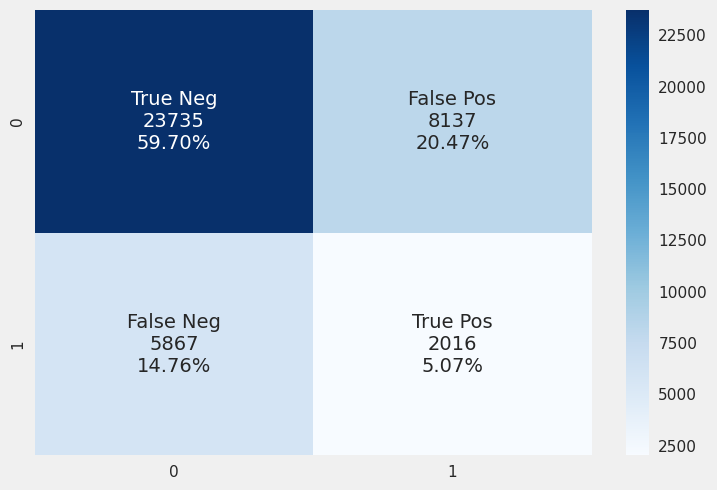

lr 0.8813146404633251
The results for model  KNeighborsClassifier() are


,0
Precision,0.053482
Recall,0.254213
F-1 Score,0.088372
ROC_AUC,0.499379
Gini_Score,0.018150


Confusion Matrix


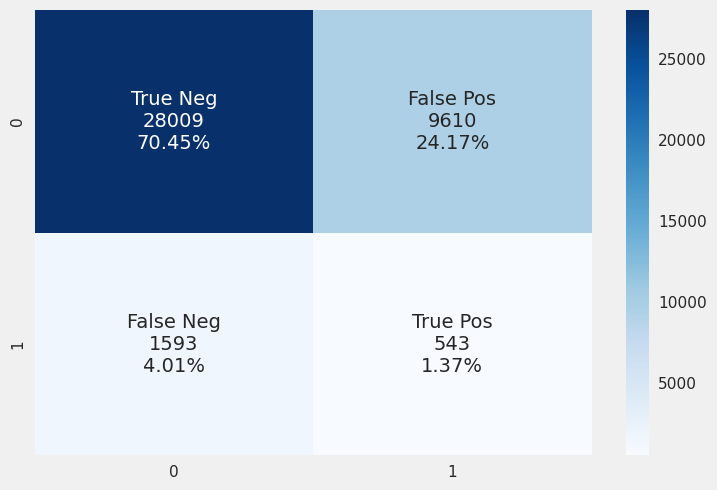

knn 0.74687446692735
The results for model  DecisionTreeClassifier(max_depth=5) are


,0
Precision,0.236383
Recall,0.256055
F-1 Score,0.245826
ROC_AUC,0.500435
Gini_Score,0.017097


Confusion Matrix


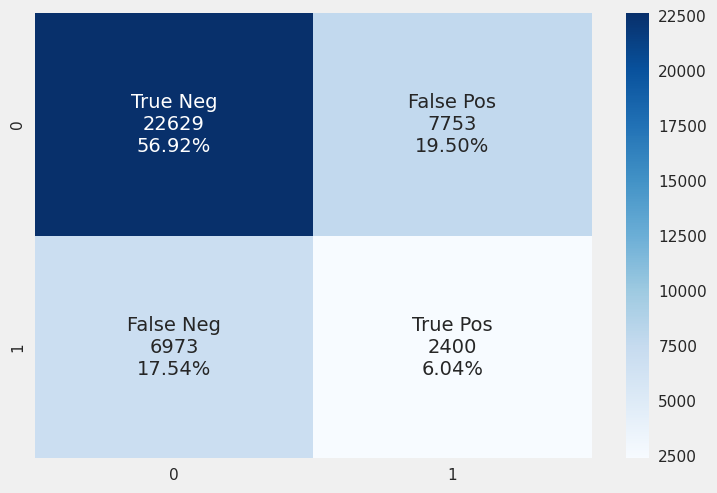

dt 0.8689892246561127
The results for model  RandomForestClassifier(max_depth=7) are


,0
Precision,0.196592
Recall,0.256522
F-1 Score,0.222594
ROC_AUC,0.500704
Gini_Score,0.017687


Confusion Matrix


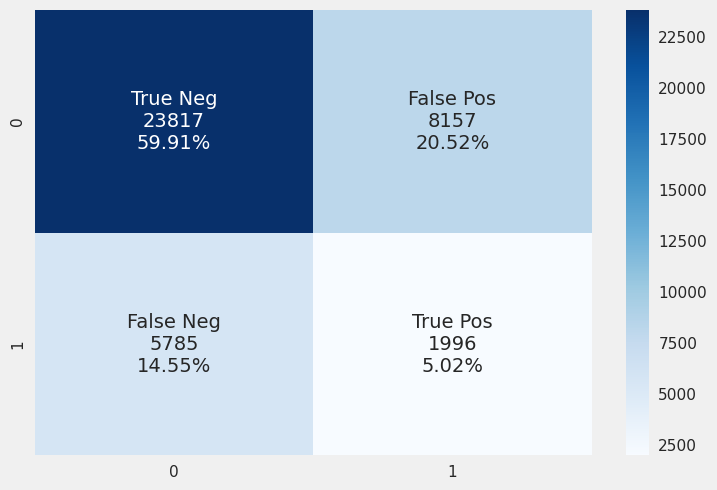

rf 0.8847104155330304
0:	learn: 0.6705668	total: 129ms	remaining: 38.7s
1:	learn: 0.6487442	total: 159ms	remaining: 23.7s
2:	learn: 0.6284521	total: 190ms	remaining: 18.8s
3:	learn: 0.6095202	total: 221ms	remaining: 16.4s
4:	learn: 0.5908993	total: 253ms	remaining: 14.9s
5:	learn: 0.5752340	total: 285ms	remaining: 14s
6:	learn: 0.5610746	total: 313ms	remaining: 13.1s
7:	learn: 0.5459756	total: 346ms	remaining: 12.6s
8:	learn: 0.5318844	total: 377ms	remaining: 12.2s
9:	learn: 0.5200363	total: 408ms	remaining: 11.8s
10:	learn: 0.5077500	total: 437ms	remaining: 11.5s
11:	learn: 0.4961033	total: 466ms	remaining: 11.2s
12:	learn: 0.4843742	total: 496ms	remaining: 11s
13:	learn: 0.4730031	total: 528ms	remaining: 10.8s
14:	learn: 0.4623184	total: 563ms	remaining: 10.7s
15:	learn: 0.4534229	total: 594ms	remaining: 10.5s
16:	learn: 0.4448865	total: 623ms	remaining: 10.4s
17:	learn: 0.4366473	total: 654ms	remaining: 10.2s
18:	learn: 0.4277564	total: 684ms	remaining: 10.1s
19:	learn: 0.4193251	to

,0
Precision,0.218064
Recall,0.252942
F-1 Score,0.234211
ROC_AUC,0.498431
Gini_Score,0.014212


Confusion Matrix


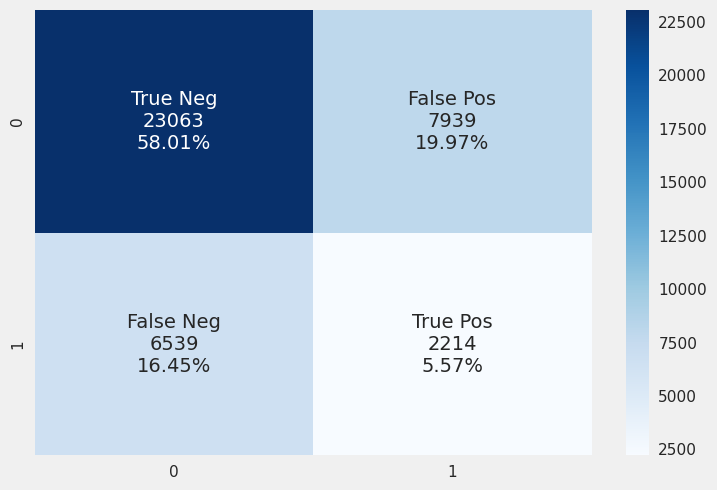

cb 0.893573033589377


In [ ]:
# evaluate the models and store results
models =get_models() 
results, names = list(), list()
for name, model in models.items():
    output_model = model.fit(X,y)
    y_pred = model.predict(test)
    scores = evaluate_model(output_model, X, y)
    print("The results for model ", output_model,"are")
    metrics_classification(y,y_pred)
    results.append(scores)
    names.append(name)
    print(name, mean(scores))


In [ ]:
from matplotlib import pyplot
pyplot.figure(figsize=(16,8))
pyplot.boxplot(results, labels=names, showmeans=True)
pyplot.show()
